# We have 3 datasets about a telecomms company. I want to predict customer behaviour based on the attributes we will find in the datasets.

## Expected Results
A predictive model that predicts the customer behaviour.


A documented API for interacting with this model that returns predictions based on input

In [1]:
# Importing libraries and reading the file

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

In [3]:
df = pd.read_csv("charges.csv") 
df

,customerID,tenure,contract,paperlessBilling,paymentMethod,monthlyCharges,totalCharges,churn
0,7590-VHVEG,1,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,34,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,2,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,45,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,2,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...
7027,6840-RESVB,24,One year,Yes,Mailed check,84.80,1990.50,No
7028,2234-XADUH,72,One year,Yes,Credit card (automatic),NaN,NaN,No
7029,4801-JZAZL,11,Month-to-month,Yes,Electronic check,29.60,346.45,No
7030,8361-LTMKD,4,Month-to-month,Yes,Mailed check,74.40,306.60,Yes


In [4]:
dfa = pd.read_csv("plan.csv")
dfa

,customerID,phoneService,multipleLines,internetService,onlineSecurity,onlineBackup,deviceProtection,techSupport,streamingTV,streamingMovies
0,5575-GNVDE,Yes,No,DSL,Yes,No,Yes,No,No,No
1,7795-CFOCW,No,No phone service,DSL,Yes,No,Yes,Yes,No,No
2,9237-HQITU,Yes,No,Fiber optic,No,No,No,No,No,No
3,1452-KIOVK,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,No
4,6713-OKOMC,No,No phone service,DSL,Yes,No,No,No,No,No
...,...,...,...,...,...,...,...,...,...,...
3535,6894-LFHLY,Yes,Yes,Fiber optic,No,No,No,No,No,No
3536,8456-QDAVC,Yes,No,Fiber optic,No,No,No,No,Yes,No
3537,2569-WGERO,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service
3538,2234-XADUH,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes


In [5]:
dfb = pd.read_csv('personal.csv')
dfb

,customerID,gender,partner,dependents,age
0,5575-GNVDE,Male,No,No,41
1,3668-QPYBK,Male,No,No,58
2,7795-CFOCW,Male,No,No,61
3,9237-HQITU,Female,No,No,66
4,9305-CDSKC,Female,No,No,87
...,...,...,...,...,...
5278,8456-QDAVC,Male,No,No,24
5279,2569-WGERO,Female,No,No,33
5280,2234-XADUH,Female,Yes,Yes,46
5281,4801-JZAZL,Female,Yes,Yes,45


In [6]:
#merging the datasets as one.

df_all= df.merge(dfa,on= 'customerID').merge(dfb, left_on= 'customerID', right_on = 'customerID', right_index = False, how= 'inner') 
df_all

#I used inner join because that would be the intersection of the 3 datasets 

,customerID,tenure,contract,paperlessBilling,paymentMethod,monthlyCharges,totalCharges,churn,phoneService,multipleLines,...,onlineSecurity,onlineBackup,deviceProtection,techSupport,streamingTV,streamingMovies,gender,partner,dependents,age
0,5575-GNVDE,34,One year,No,Mailed check,56.95,1889.50,No,Yes,No,...,Yes,No,Yes,No,No,No,Male,No,No,41
1,7795-CFOCW,45,One year,No,Bank transfer (automatic),42.30,1840.75,No,No,No phone service,...,Yes,No,Yes,Yes,No,No,Male,No,No,61
2,9237-HQITU,2,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,Yes,No,...,No,No,No,No,No,No,Female,No,No,66
3,1452-KIOVK,22,Month-to-month,Yes,Credit card (automatic),89.10,1949.40,No,Yes,Yes,...,No,Yes,No,No,Yes,No,Male,No,Yes,39
4,6713-OKOMC,10,Month-to-month,No,Mailed check,29.75,301.90,No,No,No phone service,...,Yes,No,No,No,No,No,Female,No,No,39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3532,6894-LFHLY,1,Month-to-month,Yes,Electronic check,75.75,75.75,Yes,Yes,Yes,...,No,No,No,No,No,No,Male,No,No,46
3533,8456-QDAVC,19,Month-to-month,Yes,Bank transfer (automatic),78.70,1495.10,No,Yes,No,...,No,No,No,No,Yes,No,Male,No,No,24
3534,2569-WGERO,72,Two year,Yes,Bank transfer (automatic),21.15,1419.40,No,Yes,No,...,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Female,No,No,33
3535,2234-XADUH,72,One year,Yes,Credit card (automatic),NaN,NaN,No,Yes,Yes,...,No,Yes,Yes,No,Yes,Yes,Female,Yes,Yes,46


We got 21 columns in total instead of 23 because the other two columns would hwve been duplicates of the customer ID column

In [7]:
df_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3537 entries, 0 to 3536
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        3537 non-null   object 
 1   tenure            3537 non-null   int64  
 2   contract          3537 non-null   object 
 3   paperlessBilling  3537 non-null   object 
 4   paymentMethod     3537 non-null   object 
 5   monthlyCharges    3303 non-null   float64
 6   totalCharges      3303 non-null   float64
 7   churn             3537 non-null   object 
 8   phoneService      3537 non-null   object 
 9   multipleLines     3537 non-null   object 
 10  internetService   3537 non-null   object 
 11  onlineSecurity    3537 non-null   object 
 12  onlineBackup      3537 non-null   object 
 13  deviceProtection  3537 non-null   object 
 14  techSupport       3537 non-null   object 
 15  streamingTV       3537 non-null   object 
 16  streamingMovies   3537 non-null   object 


In [8]:
df_all.describe()

,tenure,monthlyCharges,totalCharges,age
count,3537.000000,3303.000000,3303.000000,3537.000000
mean,33.097258,65.035831,2341.079352,54.876449
std,24.722753,30.326452,2300.932480,19.994393
min,1.000000,18.250000,18.800000,20.000000
25%,9.000000,35.475000,409.200000,38.000000
50%,30.000000,70.600000,1421.900000,55.000000
75%,56.000000,90.150000,3917.000000,72.000000
max,72.000000,118.750000,8672.450000,90.000000


# Data Cleaning

In [9]:
# Checking for null values in the merged dataset
df_all.isna().sum()

customerID            0
tenure                0
contract              0
paperlessBilling      0
paymentMethod         0
monthlyCharges      234
totalCharges        234
churn                 0
phoneService          0
multipleLines         0
internetService       0
onlineSecurity        0
onlineBackup          0
deviceProtection      0
techSupport           0
streamingTV           0
streamingMovies       0
gender                0
partner               0
dependents            0
age                   0
dtype: int64

In [10]:
#Checking for duplicated values
df.duplicated().sum()

0

In [11]:
df_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3537 entries, 0 to 3536
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        3537 non-null   object 
 1   tenure            3537 non-null   int64  
 2   contract          3537 non-null   object 
 3   paperlessBilling  3537 non-null   object 
 4   paymentMethod     3537 non-null   object 
 5   monthlyCharges    3303 non-null   float64
 6   totalCharges      3303 non-null   float64
 7   churn             3537 non-null   object 
 8   phoneService      3537 non-null   object 
 9   multipleLines     3537 non-null   object 
 10  internetService   3537 non-null   object 
 11  onlineSecurity    3537 non-null   object 
 12  onlineBackup      3537 non-null   object 
 13  deviceProtection  3537 non-null   object 
 14  techSupport       3537 non-null   object 
 15  streamingTV       3537 non-null   object 
 16  streamingMovies   3537 non-null   object 


In [12]:
df_all['churn'].isna().any().sum()

0

In [13]:
df_all['contract'].unique()

array(['One year', 'Month-to-month', 'Two year'], dtype=object)

In [14]:
df_all['paperlessBilling'].unique()

array(['No', 'Yes'], dtype=object)

In [15]:
df_all['paymentMethod'].unique()

array(['Mailed check', 'Bank transfer (automatic)', 'Electronic check',
       'Credit card (automatic)'], dtype=object)

In [16]:
df_all['churn'].unique()

array(['No', 'Yes'], dtype=object)

In [17]:
df_all['dependents'].unique()

array(['No', 'Yes'], dtype=object)

In [18]:
df_all['partner'].unique()

array(['No', 'Yes'], dtype=object)

In [19]:
df_all['gender'].unique()

array(['Male', 'Female'], dtype=object)

In [20]:
df_all['streamingMovies'].unique()

array(['No', 'Yes', 'No internet service'], dtype=object)

In [21]:
df_all['streamingTV'].unique()

array(['No', 'Yes', 'No internet service'], dtype=object)

In [22]:
df_all['techSupport'].unique()

array(['No', 'Yes', 'No internet service'], dtype=object)

In [23]:
df_all['deviceProtection'].unique()

array(['Yes', 'No', 'No internet service'], dtype=object)

In [24]:
df_all['onlineBackup'].unique()

array(['No', 'Yes', 'No internet service'], dtype=object)

In [25]:
df_all['onlineSecurity'].unique()

array(['Yes', 'No', 'No internet service'], dtype=object)

In [26]:
df_all['internetService'].unique()

array(['DSL', 'Fiber optic', 'No'], dtype=object)

In [27]:
df_all['multipleLines'].unique()

array(['No', 'No phone service', 'Yes'], dtype=object)

In [28]:
df_all['phoneService'].unique()

array(['Yes', 'No'], dtype=object)

These unique values are also called ordinal values, and I will like to transform them into number values first, then create additional columns in the merge dataset with them.

In [29]:
lencoder = LabelEncoder()

In [30]:

df_all[['paymentMethod', 'contract','paperlessBilling', 'multipleLines', 'internetService', 'onlineSecurity', 'onlineBackup', 
                                      'deviceProtection', 'phoneService', 'techSupport', 'streamingTV', 'streamingMovies']] = df_all[['paymentMethod', 'contract', 'paperlessBilling', 'multipleLines', 'internetService', 'onlineSecurity', 'onlineBackup', 
                                      'deviceProtection', 'phoneService', 'techSupport', 'streamingTV', 'streamingMovies']].apply(lencoder.fit_transform)

In [31]:
df_all = pd.get_dummies(df_all, columns =['partner', 'gender', 'dependents','churn'])

In [32]:
df_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3537 entries, 0 to 3536
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        3537 non-null   object 
 1   tenure            3537 non-null   int64  
 2   contract          3537 non-null   int32  
 3   paperlessBilling  3537 non-null   int32  
 4   paymentMethod     3537 non-null   int32  
 5   monthlyCharges    3303 non-null   float64
 6   totalCharges      3303 non-null   float64
 7   phoneService      3537 non-null   int32  
 8   multipleLines     3537 non-null   int32  
 9   internetService   3537 non-null   int32  
 10  onlineSecurity    3537 non-null   int32  
 11  onlineBackup      3537 non-null   int32  
 12  deviceProtection  3537 non-null   int32  
 13  techSupport       3537 non-null   int32  
 14  streamingTV       3537 non-null   int32  
 15  streamingMovies   3537 non-null   int32  
 16  age               3537 non-null   int64  


In [33]:
#checking for the nrew merged dataset with the extra columns whose unique values have been transformed.

In [34]:
df_all

,customerID,tenure,contract,paperlessBilling,paymentMethod,monthlyCharges,totalCharges,phoneService,multipleLines,internetService,...,streamingMovies,age,partner_No,partner_Yes,gender_Female,gender_Male,dependents_No,dependents_Yes,churn_No,churn_Yes
0,5575-GNVDE,34,1,0,3,56.95,1889.50,1,0,0,...,0,41,1,0,0,1,1,0,1,0
1,7795-CFOCW,45,1,0,0,42.30,1840.75,0,1,0,...,0,61,1,0,0,1,1,0,1,0
2,9237-HQITU,2,0,1,2,70.70,151.65,1,0,1,...,0,66,1,0,1,0,1,0,0,1
3,1452-KIOVK,22,0,1,1,89.10,1949.40,1,2,1,...,0,39,1,0,0,1,0,1,1,0
4,6713-OKOMC,10,0,0,3,29.75,301.90,0,1,0,...,0,39,1,0,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3532,6894-LFHLY,1,0,1,2,75.75,75.75,1,2,1,...,0,46,1,0,0,1,1,0,0,1
3533,8456-QDAVC,19,0,1,0,78.70,1495.10,1,0,1,...,0,24,1,0,0,1,1,0,1,0
3534,2569-WGERO,72,2,1,0,21.15,1419.40,1,0,2,...,1,33,1,0,1,0,1,0,1,0
3535,2234-XADUH,72,1,1,1,NaN,NaN,1,2,1,...,2,46,0,1,1,0,0,1,1,0


In [35]:
df_real = df_all.drop(columns= ['customerID'], axis =0)
df_real

,tenure,contract,paperlessBilling,paymentMethod,monthlyCharges,totalCharges,phoneService,multipleLines,internetService,onlineSecurity,...,streamingMovies,age,partner_No,partner_Yes,gender_Female,gender_Male,dependents_No,dependents_Yes,churn_No,churn_Yes
0,34,1,0,3,56.95,1889.50,1,0,0,2,...,0,41,1,0,0,1,1,0,1,0
1,45,1,0,0,42.30,1840.75,0,1,0,2,...,0,61,1,0,0,1,1,0,1,0
2,2,0,1,2,70.70,151.65,1,0,1,0,...,0,66,1,0,1,0,1,0,0,1
3,22,0,1,1,89.10,1949.40,1,2,1,0,...,0,39,1,0,0,1,0,1,1,0
4,10,0,0,3,29.75,301.90,0,1,0,2,...,0,39,1,0,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3532,1,0,1,2,75.75,75.75,1,2,1,0,...,0,46,1,0,0,1,1,0,0,1
3533,19,0,1,0,78.70,1495.10,1,0,1,0,...,0,24,1,0,0,1,1,0,1,0
3534,72,2,1,0,21.15,1419.40,1,0,2,1,...,1,33,1,0,1,0,1,0,1,0
3535,72,1,1,1,NaN,NaN,1,2,1,0,...,2,46,0,1,1,0,0,1,1,0


# EDA Questions

In [36]:
#finding the mean of the total charges

df_real['totalCharges'].mean()

2341.079352104149

### 1. How many people who had the two year contracts have churned altogether?

In [37]:
df_real.groupby(df_real['contract'] == 2)['churn_Yes'].value_counts()

contract  churn_Yes
False     0            1784
          1             897
True      0             832
          1              24
Name: churn_Yes, dtype: int64

True means those with 2 years contract, and of that category, 921 people left the company (represented by 1 for churn) while 2616 people were retained

## How many married people left the company?

In [38]:
df_real.groupby(df_real['partner_Yes']).count()['churn_Yes']

partner_Yes
0    1776
1    1761
Name: churn_Yes, dtype: int64

Those who had partners and churned are almost equal to those without partners and still churned.

In [39]:
#Let's look at null values in this final dataset.
df_real.isna().sum()

tenure                0
contract              0
paperlessBilling      0
paymentMethod         0
monthlyCharges      234
totalCharges        234
phoneService          0
multipleLines         0
internetService       0
onlineSecurity        0
onlineBackup          0
deviceProtection      0
techSupport           0
streamingTV           0
streamingMovies       0
age                   0
partner_No            0
partner_Yes           0
gender_Female         0
gender_Male           0
dependents_No         0
dependents_Yes        0
churn_No              0
churn_Yes             0
dtype: int64

In [40]:
# I am choosing to fill them with the mode and the charges with the mean

In [41]:
df_real['totalCharges']= df_real['totalCharges'].fillna(method = 'bfill', axis = 0, inplace = False)


In [42]:
df_real['monthlyCharges']= df_real['monthlyCharges'].fillna(method = 'bfill', axis = 0, inplace = False)

In [43]:
df_real

,tenure,contract,paperlessBilling,paymentMethod,monthlyCharges,totalCharges,phoneService,multipleLines,internetService,onlineSecurity,...,streamingMovies,age,partner_No,partner_Yes,gender_Female,gender_Male,dependents_No,dependents_Yes,churn_No,churn_Yes
0,34,1,0,3,56.95,1889.50,1,0,0,2,...,0,41,1,0,0,1,1,0,1,0
1,45,1,0,0,42.30,1840.75,0,1,0,2,...,0,61,1,0,0,1,1,0,1,0
2,2,0,1,2,70.70,151.65,1,0,1,0,...,0,66,1,0,1,0,1,0,0,1
3,22,0,1,1,89.10,1949.40,1,2,1,0,...,0,39,1,0,0,1,0,1,1,0
4,10,0,0,3,29.75,301.90,0,1,0,2,...,0,39,1,0,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3532,1,0,1,2,75.75,75.75,1,2,1,0,...,0,46,1,0,0,1,1,0,0,1
3533,19,0,1,0,78.70,1495.10,1,0,1,0,...,0,24,1,0,0,1,1,0,1,0
3534,72,2,1,0,21.15,1419.40,1,0,2,1,...,1,33,1,0,1,0,1,0,1,0
3535,72,1,1,1,105.65,6844.50,1,2,1,0,...,2,46,0,1,1,0,0,1,1,0


In [44]:
df_real.isna().sum()

tenure              0
contract            0
paperlessBilling    0
paymentMethod       0
monthlyCharges      0
totalCharges        0
phoneService        0
multipleLines       0
internetService     0
onlineSecurity      0
onlineBackup        0
deviceProtection    0
techSupport         0
streamingTV         0
streamingMovies     0
age                 0
partner_No          0
partner_Yes         0
gender_Female       0
gender_Male         0
dependents_No       0
dependents_Yes      0
churn_No            0
churn_Yes           0
dtype: int64

In [45]:
#finding correlation between features
corr = df_real.corr()                              #the warmer the color, the higher the correllation.
corr.style.background_gradient(cmap = 'rainbow')

,tenure,contract,paperlessBilling,paymentMethod,monthlyCharges,totalCharges,phoneService,multipleLines,internetService,onlineSecurity,onlineBackup,deviceProtection,techSupport,streamingTV,streamingMovies,age,partner_No,partner_Yes,gender_Female,gender_Male,dependents_No,dependents_Yes,churn_No,churn_Yes
tenure,1.000000,0.685148,-0.017535,-0.395636,0.235298,0.761372,0.022535,0.320420,-0.019110,0.329488,0.367818,0.385715,0.345222,0.295340,0.287265,0.016791,-0.399256,0.399256,-0.006462,0.006462,-0.165133,0.165133,0.348627,-0.348627
contract,0.685148,1.000000,-0.187871,-0.251636,-0.049360,0.427495,-0.006228,0.093285,0.092037,0.369346,0.291718,0.351934,0.443155,0.236086,0.238495,0.021861,-0.299712,0.299712,-0.006323,0.006323,-0.235143,0.235143,0.401525,-0.401525
paperlessBilling,-0.017535,-0.187871,1.000000,-0.060212,0.320834,0.127113,0.025706,0.163609,-0.146646,-0.163099,-0.018878,-0.039214,-0.104807,0.086998,0.067431,-0.005162,0.011576,-0.011576,0.011057,-0.011057,0.115830,-0.115830,-0.221520,0.221520
paymentMethod,-0.395636,-0.251636,-0.060212,1.000000,-0.177095,-0.324284,-0.028779,-0.185614,0.072198,-0.095249,-0.126859,-0.156469,-0.122753,-0.113241,-0.126205,0.012072,0.154299,-0.154299,-0.008524,0.008524,0.030012,-0.030012,-0.111534,0.111534
monthlyCharges,0.235298,-0.049360,0.320834,-0.177095,1.000000,0.661635,0.221873,0.421209,-0.307564,-0.043541,0.112685,0.161963,0.006849,0.307431,0.314408,0.018375,-0.103491,0.103491,0.004565,-0.004565,0.096344,-0.096344,-0.180494,0.180494
totalCharges,0.761372,0.427495,0.127113,-0.324284,0.661635,1.000000,0.110352,0.413287,-0.168159,0.246887,0.338533,0.365808,0.274857,0.357350,0.357113,0.031387,-0.316296,0.316296,-0.006562,0.006562,-0.062704,0.062704,0.180438,-0.180438
phoneService,0.022535,-0.006228,0.025706,-0.028779,0.221873,0.110352,1.000000,-0.017070,0.385206,-0.011476,0.028828,-0.003896,-0.014682,0.062230,0.049399,-0.002283,-0.026709,0.026709,0.000054,-0.000054,-0.013144,0.013144,-0.019215,0.019215
multipleLines,0.320420,0.093285,0.163609,-0.185614,0.421209,0.413287,-0.017070,1.000000,-0.106490,0.004508,0.116266,0.118991,0.007455,0.166894,0.169663,0.013228,-0.118765,0.118765,0.018813,-0.018813,0.037810,-0.037810,-0.067344,0.067344
internetService,-0.019110,0.092037,-0.146646,0.072198,-0.307564,-0.168159,0.385206,-0.106490,1.000000,-0.021708,0.028010,0.056930,-0.006397,0.115028,0.098809,-0.006927,-0.003912,0.003912,0.003214,-0.003214,-0.047955,0.047955,0.048252,-0.048252
onlineSecurity,0.329488,0.369346,-0.163099,-0.095249,-0.043541,0.246887,-0.011476,0.004508,-0.021708,1.000000,0.174980,0.159507,0.293409,0.037275,0.051242,0.032569,-0.160982,0.160982,0.016014,-0.016014,-0.159807,0.159807,0.295928,-0.295928


<AxesSubplot:xlabel='totalCharges', ylabel='Density'>

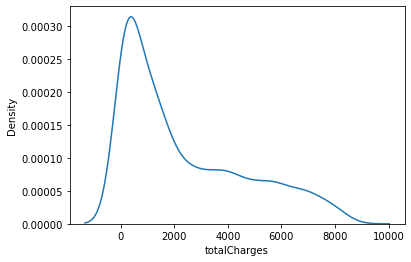

In [46]:
sns.kdeplot(x= 'totalCharges', data =df_real)

In [47]:
df_real.totalCharges.isna().sum()

0

<AxesSubplot:xlabel='contract', ylabel='tenure'>

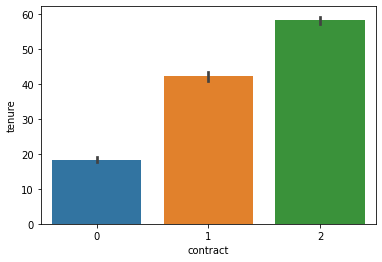

In [48]:
sns.barplot(x = 'contract', y ='tenure', hue_order = ['churn_Yes', 'churn_No'], data = df_real)

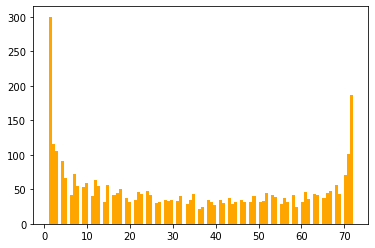

In [49]:
plt.hist(df_real.tenure, color = 'orange', bins = 100)
plt.show()

<AxesSubplot:xlabel='age', ylabel='tenure'>

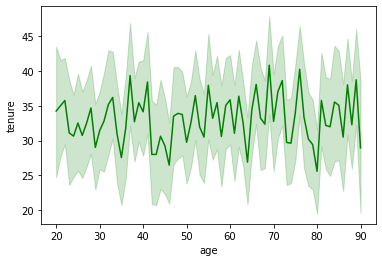

In [50]:
sns.lineplot(x = 'age', y = 'tenure', hue_order = ['churn_Yes','churn_No'], color = 'green', data = df_real)

<AxesSubplot:xlabel='totalCharges', ylabel='age'>

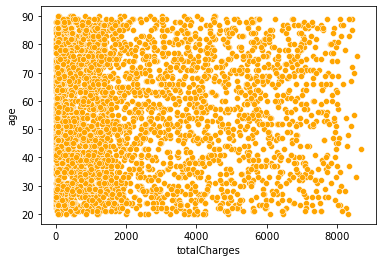

In [51]:
sns.scatterplot(y = 'age', x= 'totalCharges', hue_order = ['partner_Yes', 'partner_No'], color = 'orange', data = df_real)

In [52]:
X = df_real.drop(['churn_Yes', 'churn_No'], axis = 1).values
y = df_real[['churn_Yes', 'churn_No']].values

In [53]:
from sklearn.model_selection import train_test_split

In [54]:
# split to 70% train dataset and 30% test dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 45)

In [78]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

In [79]:
print (X_train.shape)
print (X_test.shape)
print (y_train.shape)
print (y_test.shape)

(2475, 22)
(1062, 22)
(2475, 2)
(1062, 2)


In [80]:
clf = DecisionTreeClassifier()

In [81]:
clf.fit(X_train, y_train)

DecisionTreeClassifier()

In [83]:
plt.figure(figsize = (500, 400))
tree.plot_tree(clf, filled = True)
plt.show()

In [57]:
classifier = RandomForestClassifier(n_estimators =10000, random_state =42)
classifier.fit(X_train,y_train)

RandomForestClassifier(n_estimators=10000, random_state=42)

In [58]:
classifier.fit(X_train,y_train)

RandomForestClassifier(n_estimators=10000, random_state=42)

In [59]:
predY = classifier.predict(X_test)

In [60]:
predY = pd.DataFrame(predY).rename(columns= {0: 'predY'})
predY

,predY,1
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1
...,...,...
1057,1,0
1058,0,1
1059,0,1
1060,1,0


In [61]:
from sklearn.metrics import accuracy_score, mean_squared_error, mean_absolute_error

In [62]:
import numpy as np

In [63]:
accuracy = accuracy_score(y_test, predY)
accuracy

0.8314500941619586

In [64]:
MAE = mean_absolute_error(y_test, predY)
MAE

21.5743879472693

In [65]:
np.unique(predY,return_counts=True)

(array([0, 1], dtype=uint8), array([1062, 1062], dtype=int64))

# This means that by our prediction, based on all the input features, only 196 people will likely churn from a sample of 1062 predicted data.

In [66]:
b= predY.isna().sum()
b

predY    0
1        0
dtype: int64

In [67]:
classifier.score(X_train, y_train)

1.0

In [68]:
classifier.score(X_test, y_test)

0.8314500941619586

In [69]:
from sklearn.model_selection import KFold, cross_val_score


In [70]:
classifier = DecisionTreeClassifier(random_state=42)

In [71]:
k_folds = KFold(n_splits = 20)

scores = cross_val_score(classifier, X, y, cv = k_folds)

In [72]:
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.71751412 0.74576271 0.70621469 0.72881356 0.68361582 0.72881356
 0.70621469 0.68926554 0.73446328 0.70056497 0.71186441 0.71751412
 0.6779661  0.76836158 0.73446328 0.74576271 0.74576271 0.71022727
 0.73295455 0.73863636]
Average CV Score:  0.7212378017462763
Number of CV Scores used in Average:  20


In [74]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predY))

              precision    recall  f1-score   support

           0       0.74      0.52      0.61       271
           1       0.85      0.94      0.89       791

   micro avg       0.83      0.83      0.83      1062
   macro avg       0.80      0.73      0.75      1062
weighted avg       0.82      0.83      0.82      1062
 samples avg       0.83      0.83      0.83      1062

